### Imports and minor modificaitons to dataset

In [8]:
import pandas as pd
df = pd.read_csv('..\dataset\weatherdata_temp.csv')
df.head()

,Date,Avg Temperature
0,2010-01-01,55.7
1,2010-01-02,50.6
2,2010-01-03,52.8
3,2010-01-04,51.0
4,2010-01-05,53.1


In [9]:
## setting date as index
# Convert indices to datetime with specified frequency for all data
df.set_index('Date', inplace=True)
df.index = pd.DatetimeIndex(df.index)

# Verify the indices match
print("scaled_df index frequency:", df.index.freq)

scaled_df index frequency: None


In [10]:
df.head(2)

,Avg Temperature
Date,
2010-01-01,55.7
2010-01-02,50.6


### Data Spliting, Scaling and formating

In [11]:
## spliting target training data
size = int(len(df) * 0.80)
train, test = df[0:size], df[size : len(df)]

train.shape, test.shape

((4009, 1), (1003, 1))

In [12]:
# Import necessary libraries
from sklearn.preprocessing import StandardScaler
import pandas as pd
import numpy as np

scaler_train = StandardScaler()  # For standardization (mean=0, std=1)
scaler_test = StandardScaler()  # For standardization (mean=0, std=1)


scaler_train_df = scaler_train.fit_transform(train)

# # Convert scaled data back to DataFrame
scaler_train_df = pd.DataFrame(scaler_train_df, columns=df.columns, index=train.index)

In [13]:
scaler_train_df.head()

,Avg Temperature
Date,
2010-01-01,-1.606275
2010-01-02,-1.981713
2010-01-03,-1.819760
2010-01-04,-1.952267
2010-01-05,-1.797675


In [14]:
type(scaler_train_df.index)

pandas.core.indexes.datetimes.DatetimeIndex

### AutoTS

In [3]:
from autots import AutoTS

In [4]:
from autots.models.model_list import model_lists
print(model_lists.keys())

dict_keys(['all', 'default', 'fast', 'superfast', 'parallel', 'fast_parallel', 'fast_parallel_no_arima', 'scalable', 'probabilistic', 'multivariate', 'univariate', 'no_params', 'recombination_approved', 'no_shared', 'no_shared_fast', 'experimental', 'slow', 'gpu', 'regressor', 'best', 'motifs', 'all_result_path', 'regressions', 'all_pragmatic', 'update_fit'])


In [5]:
model_list = [
    "FBProphet",
    "BallTreeMultivariateMotif",
    "PytorchForecasting",
    "NeuralProphet",
]

In [ ]:

    model = AutoTS(
        forecast_length=1003,
        frequency='D',
        ensemble='simple',
        max_generations=5,
        num_validations=2
    )

Using 3 cpus for n_jobs.


In [15]:
long = False
model = model.fit(
    scaler_train_df,
)

Data frequency is: D, used frequency is: D
Model Number: 1 with model AverageValueNaive in generation 0 of 5
Model Number: 2 with model AverageValueNaive in generation 0 of 5
Model Number: 3 with model AverageValueNaive in generation 0 of 5
Model Number: 4 with model DatepartRegression in generation 0 of 5
Model Number: 5 with model DatepartRegression in generation 0 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\svm\_base.py:1249: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  warnings.warn(


Model Number: 6 with model DatepartRegression in generation 0 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 7 with model DatepartRegression in generation 0 of 5
Template Eval Error: ImportError('Tensorflow not available, install with pip install tensorflow.') in model 7 in generation 0: DatepartRegression
Model Number: 8 with model ETS in generation 0 of 5
Model Number: 9 with model ETS in generation 0 of 5
Model Number: 10 with model GLM in generation 0 of 5
Model Number: 11 with model GLM in generation 0 of 5
Model Number: 12 with model GLS in generation 0 of 5
Model Number: 13 with model GLS in generation 0 of 5
Model Number: 14 with model LastValueNaive in generation 0 of 5
Model Number: 15 with model LastValueNaive in generation 0 of 5
Model Number: 16 with model LastValueNaive in generation 0 of 5
Model Number: 17 with model LastValueNaive in generation 0 of 5
Model Number: 18 with model SeasonalNaive in generation 0 of 5
Model Number: 19 with model SeasonalNaive in generation 0 of 5
Model Number: 20 with model SeasonalNaive in generation 0 of 5
Model Number: 21 with mode

d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=2):
ABNORMAL: .

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 25 with model FBProphet in generation 0 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
08:28:48 - cmdstanpy - INFO - Chain [1] start processing
08:28:49 - cmdstanpy - INFO - Chain [1] done processing


Model Number: 26 with model DatepartRegression in generation 0 of 5
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 26 in generation 0: DatepartRegression
Model Number: 27 with model SeasonalNaive in generation 0 of 5
Model Number: 28 with model DatepartRegression in generation 0 of 5
Model Number: 29 with model ETS in generation 0 of 5
Model Number: 30 with model ARDL in generation 0 of 5
Model Number: 31 with model UnivariateMotif in generation 0 of 5
Model Number: 32 with model UnivariateMotif in generation 0 of 5
Model Number: 33 with model SectionalMotif in generation 0 of 5
Model Number: 34 with model SectionalMotif in generation 0 of 5
Model Number: 35 with model FBProphet in generation 0 of 5
Model Number: 36 with model SeasonalNaive in generation 0 of 5
Model Number: 37 with model DatepartRegression in generation 0 of 5
Model Number: 38 with model ARCH in generation 0 of 5
Template Eval Error: ImportError('`arch` package must b

d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\core\fromnumeric.py:59: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\core\fromnumeric.py:59: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: d

Model Number: 55 with model GLM in generation 0 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\generalized_linear_model.py:1328: RuntimeWarning: invalid value encountered in multiply
  wlsendog = (lin_pred + self.family.link.deriv(mu) * (self.endog-mu)


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 55 in generation 0: GLM
Model Number: 56 with model UnivariateMotif in generation 0 of 5
Model Number: 57 with model ARDL in generation 0 of 5
Model Number: 58 with model ARCH in generation 0 of 5
Template Eval Error: ImportError('`arch` package must be installed from pip') in model 58 in generation 0: ARCH
Model Number: 59 with model ConstantNaive in generation 0 of 5
Model Number: 60 with model LastValueNaive in generation 0 of 5
Model Number: 61 with model AverageValueNaive in generation 0 of 5
Model Number: 62 with model GLS in generation 0 of 5
Model Number: 63 with model SeasonalNaive in generation 0 of 5
Model Number: 64 with model VAR in generation 0 of 5
Template Eval Error: LinAlgError('2-th leading minor of the array is not positive definite') in model 64 in generation 0: VAR
Model Number: 65 with model WindowRegression in generation 0 of 5
Template Eval Error: V

d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\core\fromnumeric.py:59: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\core\fromnumeric.py:59: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\core\fromnumeric.py:59: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)


Template Eval Error: ImportError('`arch` package must be installed from pip') in model 86 in generation 0: ARCH
Model Number: 87 with model ETS in generation 0 of 5
Model Number: 88 with model LastValueNaive in generation 0 of 5
Model Number: 89 with model ETS in generation 0 of 5
Model Number: 90 with model SeasonalNaive in generation 0 of 5
Model Number: 91 with model SeasonalityMotif in generation 0 of 5
Model Number: 92 with model FFT in generation 0 of 5
Model Number: 93 with model RRVAR in generation 0 of 5
Model Number: 94 with model GLM in generation 0 of 5
Template Eval Error: ValueError('regression_type=user and no future_regressor passed') in model 94 in generation 0: GLM
Model Number: 95 with model VAR in generation 0 of 5
Template Eval Error: ValueError('Only gave one variable to VAR') in model 95 in generation 0: VAR
Model Number: 96 with model SeasonalNaive in generation 0 of 5
Model Number: 97 with model ARDL in generation 0 of 5
Template Eval Error: ValueError("regress

d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 101 with model VAR in generation 0 of 5
Template Eval Error: ValueError('Only gave one variable to VAR') in model 101 in generation 0: VAR
Model Number: 102 with model FBProphet in generation 0 of 5
Model Number: 103 with model LastValueNaive in generation 0 of 5
Model Number: 104 with model RRVAR in generation 0 of 5
Model Number: 105 with model AverageValueNaive in generation 0 of 5
2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
Template Eval Error: ValueError('Model AverageValueNaive returned improper forecast_length. Returned: 1002 and requested: 1003') in model 105 in generation 0: AverageValueNaive
Model Number: 106 with model SeasonalityMotif in generation 0 of 5
Model Number: 107 with model SectionalMotif in generation 0 of 5
Model Number: 108 with model VAR in generation 0 of 5
Template Eval Error: ValueError('Only gave one variable to VAR') in model 108 in generation 0: VAR
Model Number: 109 with model ARCH in generation 0 of 5
Template Eval Error: 

d:\Work\Development\Python\SDP\venv\lib\site-packages\prophet\forecaster.py:533: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_holidays = pd.concat((all_holidays, country_holidays_df),
d:\Work\Development\Python\SDP\venv\lib\site-packages\prophet\forecaster.py:533: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_holidays = pd.concat((all_holidays, country_holidays_df),
d:\Work\Development\Python\SDP\venv\lib\site-packages\prophet\forecaster.py:533: FutureWarning: The behavior of DataFrame 

Model Number: 154 with model SectionalMotif in generation 0 of 5
Model Number: 155 with model SeasonalNaive in generation 0 of 5
Template Eval Error: Exception("Transformer FIRFilter failed on fit from params mean {'0': {'method': 'IQR', 'method_params': {'iqr_threshold': 2.0, 'iqr_quantiles': [0.25, 0.75]}, 'fillna': 'rolling_mean_24', 'transform_dict': None, 'isolated_only': False, 'on_inverse': False}, '1': {'numtaps': 7, 'cutoff_hz': 50, 'window': 'hamming', 'sampling_frequency': 72, 'on_transform': True, 'on_inverse': False, 'bounds_only': False}, '2': {'fixed': True, 'window': 3, 'macro_micro': False, 'center': False}, '3': {'method': 'minmax', 'method_params': {'alpha': 0.05}, 'transform_dict': None, 'reverse_alignment': False, 'isolated_only': False, 'fillna': 'time'}, '4': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 3, 'threshold_method': 'max'}} with error ValueError('Invalid cutoff frequency: frequencies must be greate

d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neighbors\_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 174 with model FBProphet in generation 1 of 5
Model Number: 175 with model AverageValueNaive in generation 1 of 5
Model Number: 176 with model LastValueNaive in generation 1 of 5
Model Number: 177 with model Cassandra in generation 1 of 5
Model Number: 178 with model SectionalMotif in generation 1 of 5
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 178 in generation 1: SectionalMotif
Model Number: 179 with model FBProphet in generation 1 of 5
Model Number: 180 with model AverageValueNaive in generation 1 of 5
Model Number: 181 with model GLS in generation 1 of 5
Model Number: 182 with model BasicLinearModel in generation 1 of 5
Model Number: 183 with model GLM in generation 1 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 184 with model WindowRegression in generation 1 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-

Model Number: 185 with model Cassandra in generation 1 of 5
Model Number: 186 with model FFT in generation 1 of 5
Template Eval Error: Exception('Transformer PCA failed on fit from params zero {\'0\': {\'whiten\': False, \'n_components\': 100}, \'1\': {\'method\': \'clip\', \'std_threshold\': 4, \'fillna\': None}, \'2\': {\'rows\': 1, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 10, \'threshold_method\': \'max\'}, \'3\': {\'regression_model\': {\'model\': \'FastRidge\', \'model_params\': {}}, \'max_lags\': 2}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 186 in generation 1: FFT
Model Number: 187 with model ARDL in generation 1 of 5
Model Number: 188 with model ARDL in generation 1 of 5
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 188 in generation 1: ARDL
Model Number: 189 with mod

d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 249 with model ETS in generation 1 of 5
Model Number: 250 with model FFT in generation 1 of 5
Model Number: 251 with model FFT in generation 1 of 5
Template Eval Error: Exception('Transformer PCA failed on fit from params zero {\'0\': {\'whiten\': False, \'n_components\': 100}, \'1\': {}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 251 in generation 1: FFT
Model Number: 252 with model ETS in generation 1 of 5
Model Number: 253 with model SeasonalityMotif in generation 1 of 5
Model Number: 254 with model ETS in generation 1 of 5
Model Number: 255 with model ConstantNaive in generation 1 of 5
Model Number: 256 with model AverageValueNaive in generation 1 of 5
Model Number: 257 with model BasicLinearModel in generation 1 of 5
Model Number: 258 with model ConstantNaive in generation 1 of 5
Model Number: 259 with model GLM in generation 1 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:527: RuntimeWarning: overflow encountered in exp
  return np.exp(z)
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: overflow encountered in divide
  endog_mu = self._clean(endog / mu)
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: invalid value encountered in multiply
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))
d:\Work\Development\Python\SDP\venv\lib\site-packages\

Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 259 in generation 1: GLM
Model Number: 260 with model SeasonalityMotif in generation 1 of 5
Model Number: 261 with model SectionalMotif in generation 1 of 5
Model Number: 262 with model ARDL in generation 1 of 5
New Generation: 2 of 5
Model Number: 263 with model SeasonalityMotif in generation 2 of 5
Model Number: 264 with model SectionalMotif in generation 2 of 5
Model Number: 265 with model GLS in generation 2 of 5
Model Number: 266 with model ARDL in generation 2 of 5
Model Number: 267 with model UnivariateMotif in generation 2 of 5
Model Number: 268 with model GLM in generation 2 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 269 with model AverageValueNaive in generation 2 of 5
Model Number: 270 with model BasicLinearModel in generation 2 of 5
Model Number: 271 with model GLM in generation 2 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "


Model Number: 272 with model BasicLinearModel in generation 2 of 5
Model Number: 273 with model ETS in generation 2 of 5
Model Number: 274 with model LastValueNaive in generation 2 of 5
Model Number: 275 with model FFT in generation 2 of 5
Model Number: 276 with model ETS in generation 2 of 5
Model Number: 277 with model FBProphet in generation 2 of 5
Model Number: 278 with model GLS in generation 2 of 5
Model Number: 279 with model SeasonalNaive in generation 2 of 5
Model Number: 280 with model Cassandra in generation 2 of 5
Model Number: 281 with model LastValueNaive in generation 2 of 5
Model Number: 282 with model GLM in generation 2 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 283 with model DatepartRegression in generation 2 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 284 with model LastValueNaive in generation 2 of 5
Model Number: 285 with model FBProphet in generation 2 of 5
Model Number: 286 with model ARDL in generation 2 of 5
Model Number: 287 with model GLS in generation 2 of 5
Model Number: 288 with model UnivariateMotif in generation 2 of 5
Model Number: 289 with model LastValueNaive in generation 2 of 5
Model Number: 290 with model AverageValueNaive in generation 2 of 5
Model Number: 291 with model DatepartRegression in generation 2 of 5
Template Eval Error: ModuleNotFoundError("No module named 'tensorflow'") in model 291 in generation 2: DatepartRegression
Model Number: 292 with model FBProphet in generation 2 of 5
Model Number: 293 with model AverageValueNaive in generation 2 of 5
Model Number: 294 with model GLM in generation 2 of 5
Model Number: 295 with model DatepartRegression in generation 2 of 5
Template Eval Error: ModuleNotFoundError("No module named 'tensorflow'") in model 295 in generation 2: DatepartRegression
Mod

d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 309 with model SectionalMotif in generation 2 of 5
Model Number: 310 with model SeasonalityMotif in generation 2 of 5
Model Number: 311 with model ARDL in generation 2 of 5
Model Number: 312 with model FBProphet in generation 2 of 5
Model Number: 313 with model LastValueNaive in generation 2 of 5
Model Number: 314 with model SeasonalityMotif in generation 2 of 5
Model Number: 315 with model SectionalMotif in generation 2 of 5
Model Number: 316 with model SeasonalNaive in generation 2 of 5
Model Number: 317 with model MetricMotif in generation 2 of 5
Model Number: 318 with model SeasonalNaive in generation 2 of 5
Model Number: 319 with model FBProphet in generation 2 of 5
Template Eval Error: Exception("Transformer SinTrend failed on fit from params ffill {'0': {'theta_values': [0, 1, 2]}, '1': {'rows': 7, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': None, 'threshold_method': 'max'}, '2': {}, '3': {}, '4': {'method': 'zscore', 'm

d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\anomaly_utils.py:1266: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  result = result + temp.where(temp.isnull(), 1).fillna(0.0)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\anomaly_utils.py:1266: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  result = result + temp.where(temp.isnull(), 1).fillna(0.0)


Model Number: 324 with model SectionalMotif in generation 2 of 5
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 324 in generation 2: SectionalMotif
Model Number: 325 with model SeasonalNaive in generation 2 of 5
Model Number: 326 with model ARDL in generation 2 of 5
Template Eval Error: Exception('Transformer ChangepointDetrend failed on fit from params ffill {\'0\': {}, \'1\': {}, \'2\': {\'model\': \'Tweedie\', \'changepoint_spacing\': 5040, \'changepoint_distance_end\': 6, \'datepart_method\': \'simple_binarized\'}} with error ValueError("Some value(s) of y are out of the valid range of the loss \'HalfTweedieLoss\'.")') in model 326 in generation 2: ARDL
Model Number: 327 with model FBProphet in generation 2 of 5
Model Number: 328 with model SeasonalityMotif in generation 2 of 5
Model Number: 329 with model BasicLinearModel in generation 2 of 5
Model Number: 330 with model DatepartRegression in generation 2 of 5
Model Number: 331

d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-

Model Number: 341 with model SeasonalityMotif in generation 2 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(


Model Number: 342 with model SeasonalNaive in generation 2 of 5
Model Number: 343 with model SectionalMotif in generation 2 of 5
Model Number: 344 with model Cassandra in generation 2 of 5
Model Number: 345 with model FBProphet in generation 2 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\prophet\forecaster.py:533: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_holidays = pd.concat((all_holidays, country_holidays_df),
d:\Work\Development\Python\SDP\venv\lib\site-packages\prophet\forecaster.py:533: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  all_holidays = pd.concat((all_holidays, country_holidays_df),
d:\Work\Development\Python\SDP\venv\lib\site-packages\prophet\forecaster.py:533: FutureWarning: The behavior of DataFrame 

Model Number: 346 with model ARDL in generation 2 of 5
Model Number: 347 with model GLM in generation 2 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:1402: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)


Model Number: 348 with model ETS in generation 2 of 5
Model Number: 349 with model AverageValueNaive in generation 2 of 5
Model Number: 350 with model GLS in generation 2 of 5
Model Number: 351 with model FBProphet in generation 2 of 5
Model Number: 352 with model SeasonalityMotif in generation 2 of 5
Model Number: 353 with model ETS in generation 2 of 5
Model Number: 354 with model BasicLinearModel in generation 2 of 5
Model Number: 355 with model SectionalMotif in generation 2 of 5
Model Number: 356 with model LastValueNaive in generation 2 of 5
Model Number: 357 with model ARDL in generation 2 of 5
Model Number: 358 with model AverageValueNaive in generation 2 of 5
Model Number: 359 with model BasicLinearModel in generation 2 of 5
Model Number: 360 with model WindowRegression in generation 2 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-

Model Number: 361 with model SeasonalityMotif in generation 2 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neighbors\_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 362 with model FFT in generation 2 of 5
Model Number: 363 with model ETS in generation 2 of 5
Model Number: 364 with model SeasonalityMotif in generation 2 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neighbors\_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 365 with model GLS in generation 2 of 5
Model Number: 366 with model ARDL in generation 2 of 5
Model Number: 367 with model LastValueNaive in generation 2 of 5
New Generation: 3 of 5
Model Number: 368 with model ETS in generation 3 of 5
Model Number: 369 with model SeasonalNaive in generation 3 of 5
Model Number: 370 with model UnivariateMotif in generation 3 of 5
Template Eval Error: Exception("Transformer BTCD failed on fit from params fake_date {'0': {'rows': 7}, '1': {}, '2': {'rows': 7}, '3': {'regression_model': {'model': 'RandomForest', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 1, 'bootstrap': True}}, 'datepart_method': ['dayofweek', [365.25, 4]], 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ScipyFilter'}, 'transformation_params': {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 31, 'polyorder': 3, 'deriv': 0, 'mode': 'interp'}}}}, 'holiday_countries_used': False, 'lags': None, 'forward_la

d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
Template Eval Error: ValueError('Model Cassandra returned improper forecast_length. Returned: 1000 and requested: 1003') in model 371 in generation 3: Cassandra
Model Number: 372 with model SeasonalNaive in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neighbors\_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 373 with model GLM in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


Model Number: 374 with model SeasonalityMotif in generation 3 of 5
Model Number: 375 with model UnivariateMotif in generation 3 of 5
Model Number: 376 with model SeasonalNaive in generation 3 of 5
Model Number: 377 with model AverageValueNaive in generation 3 of 5
Model Number: 378 with model ETS in generation 3 of 5
Model Number: 379 with model SectionalMotif in generation 3 of 5
Template Eval Error: ValueError('Model SectionalMotif returned NaN for one or more series. fail_on_forecast_nan=True') in model 379 in generation 3: SectionalMotif
Model Number: 380 with model AverageValueNaive in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\lib\function_base.py:553: RuntimeWarning: invalid value encountered in divide
  avg = avg_as_array = np.multiply(a, wgt,


Model Number: 381 with model WindowRegression in generation 3 of 5
Model Number: 382 with model SectionalMotif in generation 3 of 5
Model Number: 383 with model SeasonalityMotif in generation 3 of 5
Model Number: 384 with model WindowRegression in generation 3 of 5
Template Eval Error: InvalidParameterError("The 'alpha' parameter of MLPRegressor must be a float in the range [0.0, inf). Got None instead.") in model 384 in generation 3: WindowRegression
Model Number: 385 with model ETS in generation 3 of 5
Model Number: 386 with model AverageValueNaive in generation 3 of 5
Model Number: 387 with model ConstantNaive in generation 3 of 5
Model Number: 388 with model BasicLinearModel in generation 3 of 5
Model Number: 389 with model LastValueNaive in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.014e+02, tolerance: 3.019e-01
  model = cd_fast.enet_coordinate_descent(


Model Number: 390 with model LastValueNaive in generation 3 of 5
Model Number: 391 with model SeasonalityMotif in generation 3 of 5
Model Number: 392 with model FBProphet in generation 3 of 5
Model Number: 393 with model FBProphet in generation 3 of 5
Model Number: 394 with model SeasonalityMotif in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neighbors\_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 395 with model FBProphet in generation 3 of 5
Model Number: 396 with model BasicLinearModel in generation 3 of 5
Model Number: 397 with model MetricMotif in generation 3 of 5
Model Number: 398 with model ARDL in generation 3 of 5
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 398 in generation 3: ARDL
Model Number: 399 with model GLM in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


2018-03-28 00:00:00
2018-03-28 00:00:00
2018-03-28 00:00:00
Template Eval Error: ValueError('Model GLM returned improper forecast_length. Returned: 998 and requested: 1003') in model 399 in generation 3: GLM
Model Number: 400 with model UnivariateMotif in generation 3 of 5
Model Number: 401 with model GLS in generation 3 of 5
Model Number: 402 with model RRVAR in generation 3 of 5
Model Number: 403 with model SeasonalityMotif in generation 3 of 5
prediction too long for indepedent=False, falling back on indepedent=True
Model Number: 404 with model FFT in generation 3 of 5
Model Number: 405 with model SectionalMotif in generation 3 of 5
Model Number: 406 with model ETS in generation 3 of 5
Template Eval Error: Exception("Transformer Cointegration failed on fit from params ffill {'0': {'span': 12}, '1': {'decomp_type': 'STL', 'part': 'trend', 'seasonal': 31}, '2': {'det_order': 0, 'k_ar_diff': 2}, '3': {}, '4': {'rows': 1, 'lag': 7, 'method': 'additive', 'strength': 0.7, 'first_value_onl

d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.984e+02, tolerance: 3.014e-01
  model = cd_fast.enet_coordinate_descent(


Model Number: 410 with model LastValueNaive in generation 3 of 5
Model Number: 411 with model SectionalMotif in generation 3 of 5
Model Number: 412 with model SeasonalNaive in generation 3 of 5
Model Number: 413 with model Cassandra in generation 3 of 5
Model Number: 414 with model SeasonalNaive in generation 3 of 5
Template Eval Error: Exception('Transformer PCA failed on fit from params pchip {\'0\': {\'whiten\': False, \'n_components\': 100}, \'1\': {\'decomp_type\': \'STL\', \'part\': \'trend\', \'seasonal\': 363}, \'2\': {\'cutoff\': 0.4, \'reverse\': False, \'on_transform\': True, \'on_inverse\': False}, \'3\': {\'rows\': 1, \'lag\': 84, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': None, \'threshold_method\': \'max\'}, \'4\': {}, \'5\': {}} with error ValueError("n_components=100 must be between 0 and min(n_samples, n_features)=1 with svd_solver=\'covariance_eigh\'")') in model 414 in generation 3: SeasonalNaive
Model Number: 415 with m

d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neighbors\_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 443 with model SeasonalityMotif in generation 3 of 5
Model Number: 444 with model SectionalMotif in generation 3 of 5
Model Number: 445 with model LastValueNaive in generation 3 of 5
Model Number: 446 with model UnivariateMotif in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\linear_model\_ridge.py:215: LinAlgWarning: Ill-conditioned matrix (rcond=3.55554e-26): result may not be accurate.
  return linalg.solve(A, Xy, assume_a="pos", overwrite_a=True).T


Model Number: 447 with model UnivariateMotif in generation 3 of 5
Model Number: 448 with model GLS in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\core\fromnumeric.py:59: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)


Model Number: 449 with model GLS in generation 3 of 5
Model Number: 450 with model SectionalMotif in generation 3 of 5
Model Number: 451 with model UnivariateMotif in generation 3 of 5
Model Number: 452 with model FBProphet in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neighbors\_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 453 with model SeasonalityMotif in generation 3 of 5
prediction too long for indepedent=False, falling back on indepedent=True
Model Number: 454 with model DatepartRegression in generation 3 of 5
Model Number: 455 with model DatepartRegression in generation 3 of 5
Model Number: 456 with model Cassandra in generation 3 of 5
Model Number: 457 with model GLM in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Model Number: 458 with model MetricMotif in generation 3 of 5
Model Number: 459 with model SectionalMotif in generation 3 of 5
Model Number: 460 with model AverageValueNaive in generation 3 of 5
Model Number: 461 with model AverageValueNaive in generation 3 of 5
Model Number: 462 with model RRVAR in generation 3 of 5
Model Number: 463 with model SeasonalNaive in generation 3 of 5
Model Number: 464 with model SeasonalityMotif in generation 3 of 5
Model Number: 465 with model FFT in generation 3 of 5
Model Number: 466 with model UnivariateMotif in generation 3 of 5
Model Number: 467 with model ETS in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\thresholding.py:204: RuntimeWarning: overflow encountered in scalar power
  (1 + mean_perc_decrease) ** self.mean_weight


Model Number: 468 with model RRVAR in generation 3 of 5
Model Number: 469 with model SectionalMotif in generation 3 of 5
Model Number: 470 with model SeasonalNaive in generation 3 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neighbors\_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 471 with model ConstantNaive in generation 3 of 5
Model Number: 472 with model DatepartRegression in generation 3 of 5
New Generation: 4 of 5
Model Number: 473 with model FBProphet in generation 4 of 5
Model Number: 474 with model SeasonalityMotif in generation 4 of 5
Model Number: 475 with model Cassandra in generation 4 of 5
Model Number: 476 with model DatepartRegression in generation 4 of 5
Model Number: 477 with model ETS in generation 4 of 5
Model Number: 478 with model UnivariateMotif in generation 4 of 5
Model Number: 479 with model GLM in generation 4 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:1367: ValueWarning: Negative binomial dispersion parameter alpha not set. Using default value alpha=1.0.
  warnings.warn("Negative binomial dispersion parameter alpha not "
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:1406: RuntimeWarning: invalid value encountered in log
  resid_dev -= endog_alpha * np.log(endog_alpha / mu_alpha)


Template Eval Error: ValueError('The first guess on the deviance function returned a nan.  This could be a boundary  problem and should be reported.') in model 479 in generation 4: GLM
Model Number: 480 with model BasicLinearModel in generation 4 of 5
Model Number: 481 with model LastValueNaive in generation 4 of 5
Model Number: 482 with model FBProphet in generation 4 of 5
Model Number: 483 with model FBProphet in generation 4 of 5
Model Number: 484 with model SeasonalityMotif in generation 4 of 5
Model Number: 485 with model ARDL in generation 4 of 5
Model Number: 486 with model SectionalMotif in generation 4 of 5
Model Number: 487 with model WindowRegression in generation 4 of 5
Model Number: 488 with model ETS in generation 4 of 5
Template Eval Error: Exception("Transformer BTCD failed on fit from params pchip {'0': {'regression_model': {'model': 'FastRidge', 'model_params': {}}, 'max_lags': 2}, '1': {}, '2': {'rows': 7}, '3': {'rows': 4, 'lag': 1, 'method': 'additive', 'strength':

d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: ValueError('operands could not be broadcast together with shapes (5015,1) (1003,1) ') in model 507 in generation 4: GLM
Model Number: 508 with model BasicLinearModel in generation 4 of 5
Model Number: 509 with model Cassandra in generation 4 of 5
Model Number: 510 with model RRVAR in generation 4 of 5
Model Number: 511 with model ARDL in generation 4 of 5
Model Number: 512 with model LastValueNaive in generation 4 of 5
Model Number: 513 with model AverageValueNaive in generation 4 of 5
Model Number: 514 with model LastValueNaive in generation 4 of 5
Model Number: 515 with model LastValueNaive in generation 4 of 5
Model Number: 516 with model Cassandra in generation 4 of 5
Template Eval Error: IndexError('positional indexers are out-of-bounds') in model 516 in generation 4: Cassandra
Model Number: 517 with model SectionalMotif in generation 4 of 5
Model Number: 518 with model SeasonalNaive in generation 4 of 5
Model Number: 519 with model ARDL in generation 4 of 5
M

d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\core\fromnumeric.py:59: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)


Model Number: 539 with model BasicLinearModel in generation 4 of 5
Model Number: 540 with model BasicLinearModel in generation 4 of 5
Model Number: 541 with model FFT in generation 4 of 5
Model Number: 542 with model ETS in generation 4 of 5
Model Number: 543 with model UnivariateMotif in generation 4 of 5
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 543 in generation 4: UnivariateMotif
Model Number: 544 with model SeasonalityMotif in generation 4 of 5
Model Number: 545 with model FBProphet in generation 4 of 5
Model Number: 546 with model FBProphet in generation 4 of 5
Model Number: 547 with model SeasonalNaive in generation 4 of 5
Model Number: 548 with model DatepartRegression in generation 4 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.482e+00, tolerance: 1.369e-02
  model = cd_fast.enet_coordinate_descent(


Model Number: 549 with model UnivariateMotif in generation 4 of 5
Model Number: 550 with model DatepartRegression in generation 4 of 5
Model Number: 551 with model SectionalMotif in generation 4 of 5
Model Number: 552 with model DatepartRegression in generation 4 of 5
Model Number: 553 with model Cassandra in generation 4 of 5
Model Number: 554 with model ARDL in generation 4 of 5
Model Number: 555 with model UnivariateMotif in generation 4 of 5
Model Number: 556 with model SectionalMotif in generation 4 of 5
Model Number: 557 with model SeasonalityMotif in generation 4 of 5
Template Eval Error: Exception('Transformer ReplaceConstant failed on fit from params rolling_mean {\'0\': {\'constant\': 1, \'reintroduction_model\': {\'model\': \'xgboost\', \'model_params\': {\'booster\': \'gbtree\', \'max_depth\': 6, \'eta\': 0.03, \'min_child_weight\': 0.5, \'subsample\': 1, \'colsample_bylevel\': 0.9, \'reg_alpha\': 0, \'reg_lambda\': 1, \'n_estimators\': 10}, \'datepart_method\': \'expanded_

d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\utils\validation.py:2732: UserWarning: X has feature names, but StandardScaler was fitted without feature names
  warnings.warn(
d:\Work\Development\Python\SDP\venv\lib\site-

Model Number: 566 with model GLS in generation 4 of 5
Model Number: 567 with model SectionalMotif in generation 4 of 5
Template Eval Error: ValueError("regression_type=='User' but no future_regressor supplied") in model 567 in generation 4: SectionalMotif
Model Number: 568 with model BasicLinearModel in generation 4 of 5
Model Number: 569 with model LastValueNaive in generation 4 of 5
Model Number: 570 with model SectionalMotif in generation 4 of 5
Model Number: 571 with model ARDL in generation 4 of 5
Model Number: 572 with model Cassandra in generation 4 of 5
Template Eval Error: AttributeError("'float' object has no attribute 'shape'") in model 572 in generation 4: Cassandra
Model Number: 573 with model FBProphet in generation 4 of 5
Model Number: 574 with model SectionalMotif in generation 4 of 5
Model Number: 575 with model BasicLinearModel in generation 4 of 5
Template Eval Error: Exception("Transformer Detrend failed on fit from params fake_date {'0': {}, '1': {}, '2': {'model':

d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\core\fromnumeric.py:59: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neighbors\_classification.py:239: DataConversionWarning: A column-vector y was passed when a 1d array was expected. Please change the shape of y to (n_samples,), for example using ravel().
  return self._fit(X, y)


Model Number: 596 with model FBProphet in generation 5 of 5
Template Eval Error: Exception('Transformer ReplaceConstant failed on fit from params zero {\'0\': {\'lag\': 1, \'fill\': \'zero\'}, \'1\': {\'rows\': 84, \'lag\': 7, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': None, \'threshold_method\': \'max\'}, \'2\': {\'constant\': 0, \'reintroduction_model\': {\'model\': \'xgboost\', \'model_params\': {\'booster\': \'gblinear\', \'max_depth\': 6, \'eta\': 0.01, \'min_child_weight\': 1, \'subsample\': 1, \'colsample_bylevel\': 1, \'reg_alpha\': 0.001, \'reg_lambda\': 0.03, \'n_estimators\': 100, \'grow_policy\': \'lossguide\'}, \'datepart_method\': \'simple_poly\'}, \'fillna\': None}, \'3\': {\'model_name\': \'ucm_deterministictrend_seasonal7\', \'state_transition\': [[1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0], [0, 0, 0, 1, 0, 0, 0, 0], [0, 0, 0, 0, 1, 0, 0, 0], [0, 0, 0, 0, 0, 1, 0, 0], [0, 0, 0, 0, 0, 0, 1, 0

d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Template Eval Error: ValueError('NaN, inf or invalid value detected in weights, estimation infeasible.') in model 599 in generation 5: GLM
Model Number: 600 with model LastValueNaive in generation 5 of 5
Model Number: 601 with model SeasonalityMotif in generation 5 of 5
Model Number: 602 with model ARDL in generation 5 of 5
Model Number: 603 with model WindowRegression in generation 5 of 5


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\linear_model\_coordinate_descent.py:695: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 1.723e+02, tolerance: 1.116e-01
  model = cd_fast.enet_coordinate_descent(


Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 603 in generation 5: WindowRegression
Model Number: 604 with model FBProphet in generation 5 of 5
Template Eval Error: Exception('Transformer ReplaceConstant failed on fit from params zero {\'0\': {\'rows\': 1, \'lag\': 1, \'method\': \'additive\', \'strength\': 1.0, \'first_value_only\': False, \'threshold\': 1, \'threshold_method\': \'max\'}, \'1\': {}, \'2\': {\'constant\': 0, \'reintroduction_model\': {\'model\': \'xgboost\', \'model_params\': {\'booster\': \'gblinear\', \'max_depth\': 6, \'eta\': 0.01, \'min_child_weight\': 1, \'subsample\': 1, \'colsample_bylevel\': 1, \'reg_alpha\': 0.001, \'reg_lambda\': 0.03, \'n_estimators\': 100, \'grow_policy\': \'lossguide\'}, \'datepart_method\': \'simple_poly\'}, \'fillna\': None}, \'3\': {\'model_name\': \'ucm_deterministictrend_seasonal7\', \'state_transition\': [[1, 1, 0, 0, 0, 0, 0, 0], [0, 1, 0, 0, 0, 0, 0, 0], [0, 0, 1, 0, 0, 0, 0, 0],

d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


Model Number: 617 with model SectionalMotif in generation 5 of 5
Model Number: 618 with model FFT in generation 5 of 5
Model Number: 619 with model BasicLinearModel in generation 5 of 5
Template Eval Error: Exception('Transformer FIRFilter failed on fit from params rolling_mean {\'0\': {}, \'1\': {\'model\': \'Linear\', \'phi\': 1, \'window\': None, \'transform_dict\': None}, \'2\': {}, \'3\': {\'numtaps\': 512, \'cutoff_hz\': 0.01, \'window\': [\'gaussian\', 1.0], \'sampling_frequency\': 24, \'on_transform\': True, \'on_inverse\': False, \'bounds_only\': False}} with error ValueError("<class \'list\'> as window type is not supported.")') in model 619 in generation 5: BasicLinearModel
Model Number: 620 with model FBProphet in generation 5 of 5
Model Number: 621 with model RRVAR in generation 5 of 5
Model Number: 622 with model DatepartRegression in generation 5 of 5
Template Eval Error: ValueError("regression_type='User' but no future_regressor passed") in model 622 in generation 5: Da

d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\core\fromnumeric.py:59: RuntimeWarning: overflow encountered in accumulate
  return bound(*args, **kwds)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\transform.py:5778: RuntimeWarning: overflow encountered in multiply
  original_values = rolling_means.to_numpy() * percentages.to_numpy()


Template Eval Error: Exception('Transformer MaxAbsScaler failed on inverse from params rolling_mean_24 {\'0\': {}, \'1\': {\'window\': 24}, \'2\': {\'rows\': 7}, \'3\': {\'regression_model\': {\'model\': \'RandomForest\', \'model_params\': {\'n_estimators\': 100, \'min_samples_leaf\': 1, \'bootstrap\': True}}, \'datepart_method\': [\'dayofweek\', [365.25, 4]], \'polynomial_degree\': None, \'transform_dict\': {\'fillna\': None, \'transformations\': {\'0\': \'ScipyFilter\'}, \'transformation_params\': {\'0\': {\'method\': \'savgol_filter\', \'method_args\': {\'window_length\': 31, \'polyorder\': 3, \'deriv\': 0, \'mode\': \'interp\'}}}}, \'holiday_countries_used\': False, \'lags\': None, \'forward_lags\': None}, \'4\': {}} with ValueError("Input contains infinity or a value too large for dtype(\'float64\').")') in model 627 in generation 5: AverageValueNaive
Model Number: 628 with model AverageValueNaive in generation 5 of 5
Model Number: 629 with model ARDL in generation 5 of 5
Model Nu

d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:445: RuntimeWarning: divide by zero encountered in divide
  endog_mu = self._clean(endog / mu)
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\family.py:143: RuntimeWarning: divide by zero encountered in divide
  return 1. / (self.link.deriv(mu)**2 * self.variance(mu))


Model Number: 641 with model BasicLinearModel in generation 5 of 5
Model Number: 642 with model BasicLinearModel in generation 5 of 5
Model Number: 643 with model UnivariateMotif in generation 5 of 5
Model Number: 644 with model SeasonalNaive in generation 5 of 5
Model Number: 645 with model FBProphet in generation 5 of 5
Model Number: 646 with model ARDL in generation 5 of 5
Template Eval Error: ValueError("regression_type='User' but future_regressor not supplied") in model 646 in generation 5: ARDL
Model Number: 647 with model MetricMotif in generation 5 of 5
Model Number: 648 with model ARDL in generation 5 of 5
Model Number: 649 with model WindowRegression in generation 5 of 5
Model Number: 650 with model UnivariateMotif in generation 5 of 5
Model Number: 651 with model SectionalMotif in generation 5 of 5
Model Number: 652 with model SeasonalNaive in generation 5 of 5
Model Number: 653 with model Cassandra in generation 5 of 5
Model Number: 654 with model SectionalMotif in generati

d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


📈 2 - GLM with avg smape 44.99: 
Model Number: 3 of 100 with model RRVAR for Validation 1
3 - RRVAR with avg smape 45.01: 
Model Number: 4 of 100 with model RRVAR for Validation 1
📈 4 - RRVAR with avg smape 44.97: 
Model Number: 5 of 100 with model DatepartRegression for Validation 1
5 - DatepartRegression with avg smape 45.36: 
Model Number: 6 of 100 with model WindowRegression for Validation 1
📈 6 - WindowRegression with avg smape 44.47: 
Model Number: 7 of 100 with model GLS for Validation 1
7 - GLS with avg smape 46.24: 
Model Number: 8 of 100 with model ETS for Validation 1
📈 8 - ETS with avg smape 38.56: 
Model Number: 9 of 100 with model AverageValueNaive for Validation 1
9 - AverageValueNaive with avg smape 48.43: 
Model Number: 10 of 100 with model SectionalMotif for Validation 1
10 - SectionalMotif with avg smape 48.58: 
Model Number: 11 of 100 with model WindowRegression for Validation 1
11 - WindowRegression with avg smape 45.0: 
Model Number: 12 of 100 with model WindowReg

d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\fast_kalman.py:1142: RuntimeWarning: overflow encountered in cast
  result.smoothed.states.cov[:, j, :, :] = Ps
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\fast_kalman.py:1148: RuntimeWarning: overflow encountered in cast
  result.smoothed.observations.cov[:, j, :, :] = obs_cov
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\fast_kalman.py:1359: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, np.swapaxes(B, -1, -2))
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\fast_kalman.py:1346: RuntimeWarning: invalid value encountered in matmul
  return np.matmul(A, B)


SVD did not converge, attempting more robust approach...
Template Eval Error: Exception("Transformer KalmanSmoothing failed on fit from params fake_date {'0': {}, '1': {}, '2': {'rows': 7}, '3': {'regression_model': {'model': 'RandomForest', 'model_params': {'n_estimators': 100, 'min_samples_leaf': 1, 'bootstrap': True}}, 'datepart_method': ['dayofweek', [365.25, 4]], 'polynomial_degree': None, 'transform_dict': {'fillna': None, 'transformations': {'0': 'ScipyFilter'}, 'transformation_params': {'0': {'method': 'savgol_filter', 'method_args': {'window_length': 31, 'polyorder': 3, 'deriv': 0, 'mode': 'interp'}}}}, 'holiday_countries_used': False, 'lags': None, 'forward_lags': None}, '4': {'model_name': 'randomly generated_original', 'state_transition': [[1, 0, 0], [1, 0, 0], [1, 1, 0]], 'process_noise': [[0.0, 0.0, 0.0], [0.0, 0.0, 0.0], [0.0, 0.0, 0.0]], 'observation_model': [[1, 1, 0]], 'observation_noise': 1.0, 'em_iter': 10, 'on_transform': False, 'on_inverse': True}} with error LinA

09:06:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.


51 - FBProphet with avg smape 75.59: 
Model Number: 52 of 100 with model SeasonalNaive for Validation 1
52 - SeasonalNaive with avg smape 53.0: 
Model Number: 53 of 100 with model SectionalMotif for Validation 1
53 - SectionalMotif with avg smape 51.62: 
Model Number: 54 of 100 with model MetricMotif for Validation 1
54 - MetricMotif with avg smape 47.19: 
Model Number: 55 of 100 with model FBProphet for Validation 1
55 - FBProphet with avg smape 82.09: 
Model Number: 56 of 100 with model FBProphet for Validation 1
56 - FBProphet with avg smape 81.27: 
Model Number: 57 of 100 with model MetricMotif for Validation 1
57 - MetricMotif with avg smape 46.1: 
Model Number: 58 of 100 with model ETS for Validation 1
2015-06-29 00:00:00
2015-06-29 00:00:00
2015-06-29 00:00:00
58 - ETS with avg smape 56.86: 
Model Number: 59 of 100 with model Cassandra for Validation 1
59 - Cassandra with avg smape 90.81: 
Model Number: 60 of 100 with model UnivariateMotif for Validation 1
60 - UnivariateMotif w

d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


80 - DatepartRegression with avg smape 43.98: 
Model Number: 81 of 100 with model RRVAR for Validation 1
81 - RRVAR with avg smape 57.74: 
Model Number: 82 of 100 with model LastValueNaive for Validation 1
82 - LastValueNaive with avg smape 83.05: 
Model Number: 83 of 100 with model LastValueNaive for Validation 1
83 - LastValueNaive with avg smape 48.99: 
Model Number: 84 of 100 with model MetricMotif for Validation 1
84 - MetricMotif with avg smape 76.15: 
Model Number: 85 of 100 with model FFT for Validation 1
85 - FFT with avg smape 93.65: 
Model Number: 86 of 100 with model LastValueNaive for Validation 1
86 - LastValueNaive with avg smape 92.76: 
Model Number: 87 of 100 with model ConstantNaive for Validation 1
87 - ConstantNaive with avg smape 46.93: 
Model Number: 88 of 100 with model Cassandra for Validation 1
88 - Cassandra with avg smape 91.34: 
Model Number: 89 of 100 with model GLM for Validation 1


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


89 - GLM with avg smape 59.36: 
Model Number: 90 of 100 with model Cassandra for Validation 1
90 - Cassandra with avg smape 84.15: 
Model Number: 91 of 100 with model Cassandra for Validation 1
91 - Cassandra with avg smape 49.36: 
Model Number: 92 of 100 with model GLM for Validation 1
92 - GLM with avg smape 53.95: 
Model Number: 93 of 100 with model DatepartRegression for Validation 1
93 - DatepartRegression with avg smape 53.63: 
Model Number: 94 of 100 with model DatepartRegression for Validation 1
94 - DatepartRegression with avg smape 49.59: 
Model Number: 95 of 100 with model DatepartRegression for Validation 1
95 - DatepartRegression with avg smape 49.59: 
Model Number: 96 of 100 with model DatepartRegression for Validation 1
96 - DatepartRegression with avg smape 49.94: 
Model Number: 97 of 100 with model MetricMotif for Validation 1
97 - MetricMotif with avg smape 56.44: 
Model Number: 98 of 100 with model ConstantNaive for Validation 1
98 - ConstantNaive with avg smape 55.6

d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)


10 - SectionalMotif with avg smape 130.8: 
Model Number: 11 of 100 with model WindowRegression for Validation 2
11 - WindowRegression with avg smape 47.0: 
Model Number: 12 of 100 with model WindowRegression for Validation 2


d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


12 - WindowRegression with avg smape 46.39: 
Model Number: 13 of 100 with model ARDL for Validation 2
13 - ARDL with avg smape 48.01: 
Model Number: 14 of 100 with model ARDL for Validation 2
14 - ARDL with avg smape 48.01: 
Model Number: 15 of 100 with model WindowRegression for Validation 2
15 - WindowRegression with avg smape 46.34: 
Model Number: 16 of 100 with model FFT for Validation 2
16 - FFT with avg smape 47.1: 
Model Number: 17 of 100 with model BasicLinearModel for Validation 2
17 - BasicLinearModel with avg smape 46.09: 
Model Number: 18 of 100 with model SeasonalityMotif for Validation 2
prediction too long for indepedent=False, falling back on indepedent=True
18 - SeasonalityMotif with avg smape 47.35: 
Model Number: 19 of 100 with model SeasonalityMotif for Validation 2
prediction too long for indepedent=False, falling back on indepedent=True
19 - SeasonalityMotif with avg smape 47.24: 
Model Number: 20 of 100 with model BasicLinearModel for Validation 2
20 - BasicLinea

d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)


30 - SectionalMotif with avg smape 46.74: 
Model Number: 31 of 100 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 31 in generation 0: UnivariateMotif
Model Number: 32 of 100 with model SeasonalityMotif for Validation 2
prediction too long for indepedent=False, falling back on indepedent=True
32 - SeasonalityMotif with avg smape 46.06: 
Model Number: 33 of 100 with model SeasonalityMotif for Validation 2
prediction too long for indepedent=False, falling back on indepedent=True
33 - SeasonalityMotif with avg smape 46.1: 
Model Number: 34 of 100 with model FBProphet for Validation 2
34 - FBProphet with avg smape 49.39: 
Model Number: 35 of 100 with model SeasonalityMotif for Validation 2
prediction too long for indepedent=False, falling back on indepedent=True
35 - SeasonalityMotif with avg smape 46.17: 
Model Number: 36 of 100 with model SeasonalityMotif for Validation 2
prediction too long for 

d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)


41 - SectionalMotif with avg smape 47.93: 
Model Number: 42 of 100 with model SectionalMotif for Validation 2


d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)


42 - SectionalMotif with avg smape 47.84: 
Model Number: 43 of 100 with model SectionalMotif for Validation 2


d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)


43 - SectionalMotif with avg smape 107.78: 
Model Number: 44 of 100 with model SeasonalNaive for Validation 2
44 - SeasonalNaive with avg smape 49.59: 
Model Number: 45 of 100 with model LastValueNaive for Validation 2
45 - LastValueNaive with avg smape 50.82: 
Model Number: 46 of 100 with model ARDL for Validation 2
46 - ARDL with avg smape 48.31: 
Model Number: 47 of 100 with model FBProphet for Validation 2


09:11:45 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
09:11:49 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.


47 - FBProphet with avg smape 138.02: 
Model Number: 48 of 100 with model ARDL for Validation 2
48 - ARDL with avg smape 49.01: 
Model Number: 49 of 100 with model ARDL for Validation 2
49 - ARDL with avg smape 49.01: 
Model Number: 50 of 100 with model ARDL for Validation 2
50 - ARDL with avg smape 49.01: 
Model Number: 51 of 100 with model FBProphet for Validation 2


09:11:52 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.


51 - FBProphet with avg smape 48.34: 
Model Number: 52 of 100 with model SeasonalNaive for Validation 2
52 - SeasonalNaive with avg smape 49.63: 
Model Number: 53 of 100 with model SectionalMotif for Validation 2


d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\seasonal.py:924: RuntimeWarning: invalid value encountered in divide
  scores = np.mean(np.abs(a - b) / divisor, axis=2)


53 - SectionalMotif with avg smape 74.81: 
Model Number: 54 of 100 with model MetricMotif for Validation 2
54 - MetricMotif with avg smape 46.3: 
Model Number: 55 of 100 with model FBProphet for Validation 2


09:12:08 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.
09:12:14 - cmdstanpy - ERROR - Chain [1] error: error during processing Operation not permitted
Optimization terminated abnormally. Falling back to Newton.


55 - FBProphet with avg smape 140.49: 
Model Number: 56 of 100 with model FBProphet for Validation 2
56 - FBProphet with avg smape 140.23: 
Model Number: 57 of 100 with model MetricMotif for Validation 2
57 - MetricMotif with avg smape 46.19: 
Model Number: 58 of 100 with model ETS for Validation 2
2012-09-29 00:00:00
2012-09-29 00:00:00
2012-09-29 00:00:00
58 - ETS with avg smape 51.72: 
Model Number: 59 of 100 with model Cassandra for Validation 2


d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\anomaly_utils.py:1266: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  result = result + temp.where(temp.isnull(), 1).fillna(0.0)
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\tools\anomaly_utils.py:1266: FutureWarning: Downcasting object dtype arrays on .fillna, .ffill, .bfill is deprecated and will change in a future version. Call result.infer_objects(copy=False) instead. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  result = result + temp.where(temp.isnull(), 1).fillna(0.0)


59 - Cassandra with avg smape 51.25: 
Model Number: 60 of 100 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 60 in generation 0: UnivariateMotif
Model Number: 61 of 100 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 61 in generation 0: UnivariateMotif
Model Number: 62 of 100 with model UnivariateMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 62 in generation 0: UnivariateMotif
Model Number: 63 of 100 with model Cassandra for Validation 2
63 - Cassandra with avg smape 53.49: 
Model Number: 64 of 100 with model AverageValueNaive for Validation 2
64 - AverageValueNaive with avg smape 57.17: 
Model Number: 65 of 100 with model AverageValueNaive for Validation 2
65 - AverageValueNaive with avg smape 57.28: 
Model Number: 66 of 100 wit

d:\Work\Development\Python\SDP\venv\lib\site-packages\sklearn\neural_network\_multilayer_perceptron.py:546: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. OF ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
  self.n_iter_ = _check_optimize_result("lbfgs", opt_res, self.max_iter)


80 - DatepartRegression with avg smape 51.14: 
Model Number: 81 of 100 with model RRVAR for Validation 2
81 - RRVAR with avg smape 64.54: 
Model Number: 82 of 100 with model LastValueNaive for Validation 2
82 - LastValueNaive with avg smape 58.36: 
Model Number: 83 of 100 with model LastValueNaive for Validation 2
83 - LastValueNaive with avg smape 46.41: 
Model Number: 84 of 100 with model MetricMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 84 in generation 0: MetricMotif
Model Number: 85 of 100 with model FFT for Validation 2
85 - FFT with avg smape 66.04: 
Model Number: 86 of 100 with model LastValueNaive for Validation 2
86 - LastValueNaive with avg smape 60.32: 
Model Number: 87 of 100 with model ConstantNaive for Validation 2
87 - ConstantNaive with avg smape 52.25: 
Model Number: 88 of 100 with model Cassandra for Validation 2
88 - Cassandra with avg smape 122.3: 
Model Number: 89 of 100 with model GLM for

d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]
d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\generalized_linear_model.py:308: DomainWarning: The InversePower link function does not respect the domain of the Gamma family.
  warnings.warn((f"The {type(family.link).__name__} link function "


89 - GLM with avg smape 59.56: 
Model Number: 90 of 100 with model Cassandra for Validation 2
90 - Cassandra with avg smape 76.82: 
Model Number: 91 of 100 with model Cassandra for Validation 2


d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\lib\function_base.py:2897: RuntimeWarning: invalid value encountered in divide
  c /= stddev[:, None]
d:\Work\Development\Python\SDP\venv\lib\site-packages\numpy\lib\function_base.py:2898: RuntimeWarning: invalid value encountered in divide
  c /= stddev[None, :]


91 - Cassandra with avg smape 54.83: 
Model Number: 92 of 100 with model GLM for Validation 2
92 - GLM with avg smape 56.07: 
Model Number: 93 of 100 with model DatepartRegression for Validation 2
93 - DatepartRegression with avg smape 55.17: 
Model Number: 94 of 100 with model DatepartRegression for Validation 2
94 - DatepartRegression with avg smape 62.91: 
Model Number: 95 of 100 with model DatepartRegression for Validation 2
95 - DatepartRegression with avg smape 62.91: 
Model Number: 96 of 100 with model DatepartRegression for Validation 2
96 - DatepartRegression with avg smape 55.6: 
Model Number: 97 of 100 with model MetricMotif for Validation 2
Template Eval Error: ValueError('window shape cannot be larger than input array shape') in model 97 in generation 0: MetricMotif
Model Number: 98 of 100 with model ConstantNaive for Validation 2
98 - ConstantNaive with avg smape 59.06: 
Model Number: 99 of 100 with model ConstantNaive for Validation 2
99 - ConstantNaive with avg smape 65

d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(


Model Number: 862 with model Ensemble in generation 7 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 867 in generation 7: Ensemble
Model Number: 868 with model Ensemble in generation 7 of Ensembles


d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 873 in generation 7: Ensemble
Model Number: 874 with model Ensemble in generation 7 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 879 in generation 7: Ensemble
Model Number: 880 with model Ensemble in generation 7 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_metho

d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 903 in generation 7: Ensemble
Model Number: 904 with model Ensemble in generation 7 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 909 in generation 7: Ensemble
Model Number: 910 with model Ensemble in generation 7 of Ensembles
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_metho

d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


7 - Ensemble with avg smape 44.89: 
8 - Ensemble with avg smape 44.91: 
📈 9 - Ensemble with avg smape 39.35: 
10 - Ensemble with avg smape 49.42: 
11 - Ensemble with avg smape 113.9: 
12 - Ensemble with avg smape 148.93: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 12 in generation 0: Ensemble
Model Number: 13 of 9 with model Ensemble for Validation 1
13 - Ensemble with avg smape 39.63: 
14 - Ensemble with avg smape 39.64: 
15 - Ensemble with avg smape 43.39: 
16 - Ensemble with avg smape 43.05: 
17 - Ensemble with avg smape 114.84: 
18 - Ensemble with avg smape 148.93: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value

d:\Work\Development\Python\SDP\venv\lib\site-packages\statsmodels\genmod\families\links.py:198: RuntimeWarning: overflow encountered in exp
  t = np.exp(-z)


37 - Ensemble with avg smape 44.17: 
38 - Ensemble with avg smape 44.19: 
39 - Ensemble with avg smape 41.44: 
40 - Ensemble with avg smape 48.41: 
41 - Ensemble with avg smape 114.23: 
42 - Ensemble with avg smape 148.93: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_value_only': False, 'threshold': 10, 'threshold_method': 'mean'}, '1': {'window': 28}} with error KeyError('2')") in model 42 in generation 0: Ensemble
Model Number: 43 of 9 with model Ensemble for Validation 1
43 - Ensemble with avg smape 41.71: 
44 - Ensemble with avg smape 41.73: 
45 - Ensemble with avg smape 41.55: 
46 - Ensemble with avg smape 45.5: 
47 - Ensemble with avg smape 114.46: 
48 - Ensemble with avg smape 148.93: 
Template Eval Error: Exception("Transformer HistoricValues failed on fit from params fake_date {'0': {'rows': 1, 'lag': 1, 'method': 'additive', 'strength': 1.0, 'first_valu

d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(
d:\Work\Development\Python\SDP\venv\lib\site-packages\autots\evaluator\auto_model.py:3068: FutureWarning: Downcasting behavior in `replace` is deprecated and will be removed in a future version. To retain the old behavior, explicitly call `result.infer_objects(copy=False)`. To opt-in to the future behavior, set `pd.set_option('future.no_silent_downcasting', True)`
  validation_results.model_results = validation_results.model_results.replace(


### Saving a model for later use

In [43]:
model.export_template(
    r"..\models\autots_models_second_train.json",  # Use raw string with backslashes
    models="all",
    # max_per_model_class=1,
    include_results=True,
)

### making predictions and ploting the result from all models

In [16]:
model_results = model.results()

In [17]:
model_results.head()

,ID,Model,ModelParameters,TransformationParameters,TransformationRuntime,FitRuntime,PredictRuntime,TotalRuntime,Ensemble,Exceptions,...,dwae_weighted,mqae_weighted,ewmae_weighted,uwmse_weighted,smoothness_weighted,wasserstein_weighted,dwd_weighted,custom_weighted,TotalRuntimeSeconds,Score
681,d3081b47ff9ad2349c0023c23529ac8e,LastValueNaive,{},"{""fillna"": ""median"", ""transformations"": {""0"": ...",0 days 00:00:01.991938,0 days 00:00:00.002011,0 days 00:00:00,0 days 00:00:02.002909,0,NaN,...,1.464019,0.165818,0.896292,6.614509,0.038481,66.935185,267.047794,0.0,2.0029,12.205403
668,18867ed034340652886cb3aebdcd388b,ETS,"{""damped_trend"": false, ""trend"": null, ""season...","{""fillna"": ""fake_date"", ""transformations"": {""0...",0 days 00:00:01.987927,0 days 00:00:00,0 days 00:00:02.092559,0 days 00:00:04.089598,0,NaN,...,1.465073,0.165620,0.895862,6.448023,0.038917,69.828884,266.567054,0.0,4.0896,12.242088
938,320fa408d52e3a542f97b5d565367fb6,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 3, ""mod...",{},0 days 00:00:00,0 days 00:00:08.972042,0 days 00:00:00,0 days 00:00:08.989795,1,NaN,...,1.456240,0.167633,0.917168,5.734620,0.030488,53.565064,275.013794,0.0,8.9898,12.443601
939,6692ebd9bcc69c6e9e7ec2d81f2957ff,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 3, ""mod...","{""fillna"": ""fake_date"", ""transformations"": {""0...",0 days 00:00:00,0 days 00:00:08.972042,0 days 00:00:00,0 days 00:00:09.003314,1,NaN,...,1.457526,0.167732,0.917360,12.422438,0.030599,53.089561,275.062265,0.0,9.0033,12.450419
933,c4a82a3773765ff7772f85bcda75c79e,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 5, ""mod...","{""fillna"": ""fake_date"", ""transformations"": {""0...",0 days 00:00:00,0 days 00:00:19.704671,0 days 00:00:00,0 days 00:00:19.780353,1,NaN,...,1.486701,0.172813,0.921106,12.383877,0.038135,206.870567,267.736363,0.0,19.7804,12.693904


In [18]:
model_results.shape

(1050, 64)

In [41]:
# Get top 5 models sorted by validation score
top_models = model_results.sort_values('Score', ascending=True).head(10)

# Print detailed information for each model
print("Top 10 Models by Score:")
print("-" * 50)
for idx, (index, row) in enumerate(top_models.iterrows(), 1):
    print(f"\n{idx}. Model name: {row['Model']}")
    print(f"   Model ID: {row['ID']}")
    print(f"   Score: {row['Score']:.4f}")
    print(f"   Runtime: {row['TotalRuntimeSeconds']:.2f} seconds")
    print(f"   Parameters: {row['ModelParameters']}")

Top 10 Models by Score:
--------------------------------------------------

1. Model name: LastValueNaive
   Model ID: d3081b47ff9ad2349c0023c23529ac8e
   Score: 12.2054
   Runtime: 2.00 seconds
   Parameters: {}

2. Model name: ETS
   Model ID: 18867ed034340652886cb3aebdcd388b
   Score: 12.2421
   Runtime: 4.09 seconds
   Parameters: {"damped_trend": false, "trend": null, "seasonal": null, "seasonal_periods": null, "method": "L-BFGS-B"}

3. Model name: Ensemble
   Model ID: 320fa408d52e3a542f97b5d565367fb6
   Score: 12.4436
   Runtime: 8.99 seconds
   Parameters: {"model_name": "BestN", "model_count": 3, "model_metric": "mixed_metric", "models": {"18867ed034340652886cb3aebdcd388b": {"Model": "ETS", "ModelParameters": "{\"damped_trend\": false, \"trend\": null, \"seasonal\": null, \"seasonal_periods\": null, \"method\": \"L-BFGS-B\"}", "TransformationParameters": "{\"fillna\": \"fake_date\", \"transformations\": {\"0\": \"bkfilter\", \"1\": \"RobustScaler\", \"2\": \"ShiftFirstValue\",

In [80]:
top_models.ModelParameters.where(top_models.ID == '0f8d54205d48044d88c96ee5e96dcc55').dropna().values[0]

'{"model_name": "BestN", "model_count": 3, "model_metric": "bestn_horizontal", "models": {"18867ed034340652886cb3aebdcd388b": {"Model": "ETS", "ModelParameters": "{\\"damped_trend\\": false, \\"trend\\": null, \\"seasonal\\": null, \\"seasonal_periods\\": null, \\"method\\": \\"L-BFGS-B\\"}", "TransformationParameters": "{\\"fillna\\": \\"fake_date\\", \\"transformations\\": {\\"0\\": \\"bkfilter\\", \\"1\\": \\"RobustScaler\\", \\"2\\": \\"ShiftFirstValue\\", \\"3\\": \\"DatepartRegression\\"}, \\"transformation_params\\": {\\"0\\": {}, \\"1\\": {}, \\"2\\": {\\"rows\\": 7}, \\"3\\": {\\"regression_model\\": {\\"model\\": \\"RandomForest\\", \\"model_params\\": {\\"n_estimators\\": 100, \\"min_samples_leaf\\": 1, \\"bootstrap\\": true}}, \\"datepart_method\\": [\\"dayofweek\\", [365.25, 4]], \\"polynomial_degree\\": null, \\"transform_dict\\": {\\"fillna\\": null, \\"transformations\\": {\\"0\\": \\"ScipyFilter\\"}, \\"transformation_params\\": {\\"0\\": {\\"method\\": \\"savgol_filte

### prediction forecasting of 10 models with least score  **(better model)**

##### making forecast

In [42]:
top_models

,ID,Model,ModelParameters,TransformationParameters,TransformationRuntime,FitRuntime,PredictRuntime,TotalRuntime,Ensemble,Exceptions,...,dwae_weighted,mqae_weighted,ewmae_weighted,uwmse_weighted,smoothness_weighted,wasserstein_weighted,dwd_weighted,custom_weighted,TotalRuntimeSeconds,Score
681,d3081b47ff9ad2349c0023c23529ac8e,LastValueNaive,{},"{""fillna"": ""median"", ""transformations"": {""0"": ...",0 days 00:00:01.991938,0 days 00:00:00.002011,0 days 00:00:00,0 days 00:00:02.002909,0,NaN,...,1.464019,0.165818,0.896292,6.614509,0.038481,66.935185,267.047794,0.0,2.0029,12.205403
668,18867ed034340652886cb3aebdcd388b,ETS,"{""damped_trend"": false, ""trend"": null, ""season...","{""fillna"": ""fake_date"", ""transformations"": {""0...",0 days 00:00:01.987927,0 days 00:00:00,0 days 00:00:02.092559,0 days 00:00:04.089598,0,NaN,...,1.465073,0.165620,0.895862,6.448023,0.038917,69.828884,266.567054,0.0,4.0896,12.242088
938,320fa408d52e3a542f97b5d565367fb6,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 3, ""mod...",{},0 days 00:00:00,0 days 00:00:08.972042,0 days 00:00:00,0 days 00:00:08.989795,1,NaN,...,1.456240,0.167633,0.917168,5.734620,0.030488,53.565064,275.013794,0.0,8.9898,12.443601
939,6692ebd9bcc69c6e9e7ec2d81f2957ff,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 3, ""mod...","{""fillna"": ""fake_date"", ""transformations"": {""0...",0 days 00:00:00,0 days 00:00:08.972042,0 days 00:00:00,0 days 00:00:09.003314,1,NaN,...,1.457526,0.167732,0.917360,12.422438,0.030599,53.089561,275.062265,0.0,9.0033,12.450419
933,c4a82a3773765ff7772f85bcda75c79e,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 5, ""mod...","{""fillna"": ""fake_date"", ""transformations"": {""0...",0 days 00:00:00,0 days 00:00:19.704671,0 days 00:00:00,0 days 00:00:19.780353,1,NaN,...,1.486701,0.172813,0.921106,12.383877,0.038135,206.870567,267.736363,0.0,19.7804,12.693904
945,3bd94afcb9a633a058485cde60cb8090,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 5, ""mod...",{},0 days 00:00:00,0 days 00:00:14.060004,0 days 00:00:00.002460,0 days 00:00:14.077662,1,NaN,...,1.484566,0.177947,0.947413,6.507851,0.027659,42.789078,276.702540,0.0,14.0777,12.818348
946,74f37585d895d806160d1bef301fbf8e,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 5, ""mod...","{""fillna"": ""fake_date"", ""transformations"": {""0...",0 days 00:00:00,0 days 00:00:14.060004,0 days 00:00:00.002460,0 days 00:00:14.093988,1,NaN,...,1.485774,0.178028,0.947566,12.058665,0.027786,42.491029,276.733144,0.0,14.0940,12.823129
941,7692f54acc9e827dc594387ba0e1fc26,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 3, ""mod...","{""fillna"": ""rolling_mean_24"", ""transformations...",0 days 00:00:00,0 days 00:00:08.972042,0 days 00:00:00,0 days 00:00:09.047656,1,NaN,...,1.457265,0.178560,0.954749,7.976338,0.000734,51.333247,298.742796,0.0,9.0477,12.872012
973,0acb6e46c8ae234bba328bf53bbdfd5d,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 3, ""mod...",{},0 days 00:00:00,0 days 00:00:11.403240,0 days 00:00:00.003335,0 days 00:00:11.421152,1,NaN,...,1.468510,0.176516,0.963216,5.546786,0.030847,145.330861,274.852968,0.0,11.4212,12.951950
974,0f8d54205d48044d88c96ee5e96dcc55,Ensemble,"{""model_name"": ""BestN"", ""model_count"": 3, ""mod...","{""fillna"": ""fake_date"", ""transformations"": {""0...",0 days 00:00:00,0 days 00:00:11.403240,0 days 00:00:00.003335,0 days 00:00:11.442335,1,NaN,...,1.469811,0.176656,0.963428,12.732822,0.030974,144.668833,274.855050,0.0,11.4423,12.959035


In [ ]:
## predicting the forcast for next 1003 days for top 10 models from autots
LastValueNaive = model._predict(model_id="d3081b47ff9ad2349c0023c23529ac8e")
ets = model._predict(model_id="18867ed034340652886cb3aebdcd388b")
Ensemble_1 = model._predict(model_id="320fa408d52e3a542f97b5d565367fb6")
Ensemble_2 = model._predict(model_id="6692ebd9bcc69c6e9e7ec2d81f2957ff")
Ensemble_3 = model._predict(model_id="c4a82a3773765ff7772f85bcda75c79e")
Ensemble_4 = model._predict(model_id="3bd94afcb9a633a058485cde60cb8090")
Ensemble_5 = model._predict(model_id="74f37585d895d806160d1bef301fbf8e")
Ensemble_6 = model._predict(model_id="7692f54acc9e827dc594387ba0e1fc26")
Ensemble_7 = model._predict(model_id="0acb6e46c8ae234bba328bf53bbdfd5d")
Ensemble_8 = model._predict(model_id="0f8d54205d48044d88c96ee5e96dcc55")

In [ ]:
## checking the resulting forecast for lastvalue naive and ets model
LastValueNaive.forecast.head(), ets.forecast.head()

(            Avg Temperature
 2020-12-25        -1.644557
 2020-12-26        -1.559749
 2020-12-27        -1.715545
 2020-12-28        -1.718428
 2020-12-29        -1.658607,
             Avg Temperature
 2020-12-25        -1.617618
 2020-12-26        -1.596991
 2020-12-27        -1.644515
 2020-12-28        -1.586955
 2020-12-29        -1.616814)

In [ ]:
LastValueNaive

Prediction object: 
Return .forecast, 
 .upper_forecast, 
 .lower_forecast 
 .model_parameters 
 .transformation_parameters

In [ ]:
LastValueNaive.upper_forecast
LastValueNaive.lower_forecast

,Avg Temperature
2020-12-25,-1.466390
2020-12-26,-1.381582
2020-12-27,-1.537378
2020-12-28,-1.540261
2020-12-29,-1.480440
...,...
2023-09-19,0.751255
2023-09-20,0.711505
2023-09-21,0.701929
2023-09-22,0.706346


In [50]:
## Convert scaled data back to unscaled DataFrame with original column names
# LastValueNaive
LastValueNaive_forcast_unscaled = pd.DataFrame(
    scaler_train.inverse_transform(LastValueNaive.forecast),
    columns=LastValueNaive.forecast.columns,
    index=LastValueNaive.forecast.index,
)
# ETS
ets_forcast_unscaled = pd.DataFrame(
    scaler_train.inverse_transform(ets.forecast),
    columns=ets.forecast.columns,
    index=ets.forecast.index,
)
# Ensemble_1
Ensemble_1_forcast_unscaled = pd.DataFrame(
    scaler_train.inverse_transform(Ensemble_1.forecast),
    columns=Ensemble_1.forecast.columns,
    index=Ensemble_1.forecast.index,
)
# Ensemble_2
Ensemble_2_forcast_unscaled = pd.DataFrame(
    scaler_train.inverse_transform(Ensemble_2.forecast),
    columns=Ensemble_2.forecast.columns,
    index=Ensemble_2.forecast.index,
)
# Ensemble_3
Ensemble_3_forcast_unscaled = pd.DataFrame(
    scaler_train.inverse_transform(Ensemble_3.forecast),
    columns=Ensemble_3.forecast.columns,
    index=Ensemble_3.forecast.index,
)
# Ensemble_4
Ensemble_4_forcast_unscaled = pd.DataFrame(
    scaler_train.inverse_transform(Ensemble_4.forecast),
    columns=Ensemble_4.forecast.columns,
    index=Ensemble_4.forecast.index,
)
# Ensemble_5
Ensemble_5_forcast_unscaled = pd.DataFrame(
    scaler_train.inverse_transform(Ensemble_5.forecast),
    columns=Ensemble_5.forecast.columns,
    index=Ensemble_5.forecast.index,
)
# Ensemble_6
Ensemble_6_forcast_unscaled = pd.DataFrame(
    scaler_train.inverse_transform(Ensemble_6.forecast),
    columns=Ensemble_6.forecast.columns,
    index=Ensemble_6.forecast.index,
)
# Ensemble_7
Ensemble_7_forcast_unscaled = pd.DataFrame(
    scaler_train.inverse_transform(Ensemble_7.forecast),
    columns=Ensemble_7.forecast.columns,
    index=Ensemble_7.forecast.index,
)
# Ensemble_8
Ensemble_8_forcast_unscaled = pd.DataFrame(
    scaler_train.inverse_transform(Ensemble_8.forecast),
    columns=Ensemble_8.forecast.columns,
    index=Ensemble_8.forecast.index,
)

In [51]:
LastValueNaive_forcast_unscaled.head(), Ensemble_8_forcast_unscaled.head()

(            Avg Temperature
 2020-12-25        55.179978
 2020-12-26        56.332014
 2020-12-27        54.215659
 2020-12-28        54.176501
 2020-12-29        54.989119,
             Avg Temperature
 2020-12-25        55.800000
 2020-12-26        55.539254
 2020-12-27        54.197974
 2020-12-28        53.983514
 2020-12-29        54.478447)

##### Combined all models plot

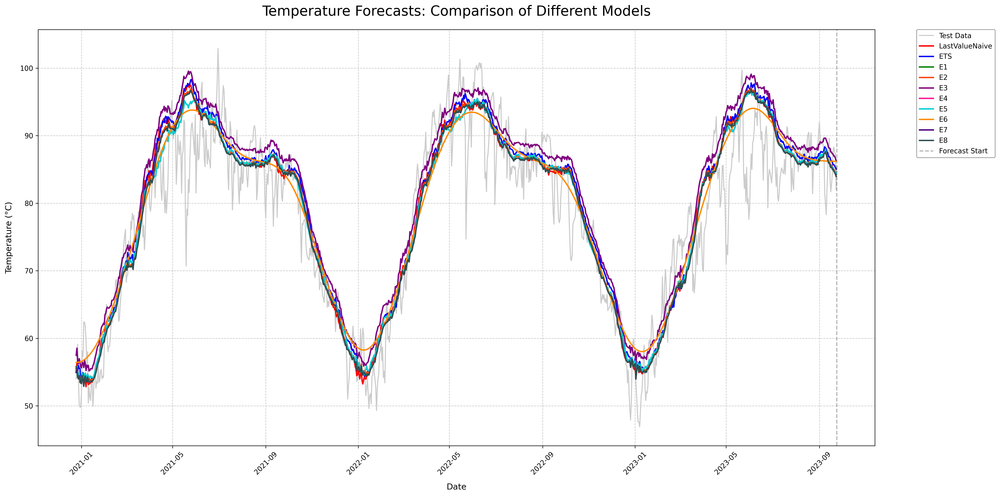

In [69]:
import matplotlib.pyplot as plt

# Create a large, high-quality figure
plt.figure(figsize=(20, 10), dpi=300)

# Plot original data
# plt.plot(
#     train.index,
#     train['Avg Temperature'],
#     label="Training Data",
#     color="gray",
#     alpha=0.5,
#     linewidth=1
# )
plt.plot(
    test.index,
    test["Avg Temperature"],
    label="Test Data",
    color="#CCCCCC",
    linewidth=1.5,
    # alpha=0.8,
)

# Define new colors for forecasts (more vibrant)
forecast_colors = [
    "#FF0000",  # Bright Red
    "#0000FF",  # Bright Blue
    "#008000",  # Green
    "#FF4500",  # Orange Red
    "#800080",  # Purple
    "#FF1493",  # Deep Pink
    "#00CED1",  # Dark Turquoise
    "#FF8C00",  # Dark Orange
    "#4B0082",  # Indigo
    "#2F4F4F",  # Dark Slate Gray
]

# Plot each model's forecast
forecasts = [
    (LastValueNaive_forcast_unscaled, "LastValueNaive"),
    (ets_forcast_unscaled, "ETS"),
    (Ensemble_1_forcast_unscaled, "E1"),
    (Ensemble_2_forcast_unscaled, "E2"),
    (Ensemble_3_forcast_unscaled, "E3"),
    (Ensemble_4_forcast_unscaled, "E4"),
    (Ensemble_5_forcast_unscaled, "E5"),
    (Ensemble_6_forcast_unscaled, "E6"),
    (Ensemble_7_forcast_unscaled, "E7"),
    (Ensemble_8_forcast_unscaled, "E8"),
]

for (forecast, name), color in zip(forecasts, forecast_colors):
    plt.plot(
        forecast.index,
        forecast["Avg Temperature"],
        label=f"{name}",
        color=color,
        linewidth=2,
    )

# Add vertical line to separate historical and forecast periods
plt.axvline(
    x=test.index[-1], color="black", linestyle="--", alpha=0.3, label="Forecast Start"
)

# Customize the plot
plt.title(
    "Temperature Forecasts: Comparison of Different Models", fontsize=20, pad=20
)
plt.xlabel("Date", fontsize=12, labelpad=10)
plt.ylabel("Temperature (°C)", fontsize=12, labelpad=10)

# Customize grid
plt.grid(True, linestyle="--", alpha=0.7)

# Customize legend
plt.legend(
    bbox_to_anchor=(1.05, 1),
    loc="upper left",
    borderaxespad=0.0,
    fontsize=10,
    frameon=True,
    facecolor="white",
    edgecolor="gray",
)

# Rotate x-axis labels
plt.xticks(rotation=45)

# Adjust layout to prevent label cutoff
plt.tight_layout()

# Save the plot in high resolution
plt.savefig(
    "model_comparison.png",
    dpi=300,
    bbox_inches="tight",
    facecolor="white",
    edgecolor="none",
)

plt.show()

##### individual models forecast plotting 

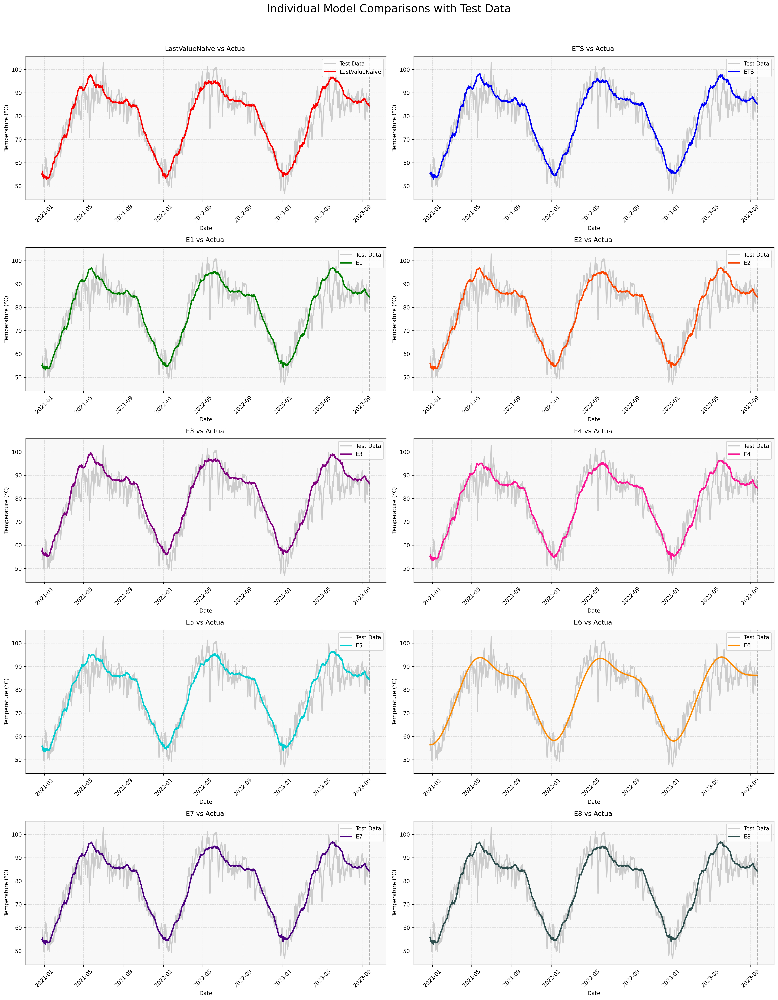

In [67]:


# Calculate number of rows and columns for subplots
n_models = len(forecasts)
n_cols = 2
n_rows = (n_models + 1) // 2

# Create figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows), dpi=300)
axes = axes.flatten()

# Plot each model in a separate subplot
for idx, ((forecast, name), color) in enumerate(zip(forecasts, forecast_colors)):
    ax = axes[idx]
    
    # Plot test data with lighter color
    ax.plot(
        test.index,
        test["Avg Temperature"],
        label="Test Data",
        color="#CCCCCC",  # Light gray
        linewidth=2,
    )
    
    # Plot forecast with vibrant color
    ax.plot(
        forecast.index,
        forecast["Avg Temperature"],
        label=f"{name}",
        color=color,
        linewidth=2.5,  # Increased line width
        alpha=1.0       # Full opacity
    )
    
    # Add vertical line for forecast start
    ax.axvline(
        x=test.index[-1],
        color="#666666",  # Darker gray
        linestyle="--",
        alpha=0.5
    )
    
    # Customize subplot with white background
    ax.set_facecolor('#F8F8F8')  # Light background
    ax.set_title(f"{name} vs Actual", fontsize=12, pad=10)
    ax.set_xlabel("Date", fontsize=10)
    ax.set_ylabel("Temperature (°C)", fontsize=10)
    ax.grid(True, linestyle="--", alpha=0.3, color='#999999')
    ax.tick_params(axis='x', rotation=45)
    ax.legend(loc='upper right', frameon=True, facecolor='white', edgecolor='#CCCCCC')

# Remove empty subplots if any
for idx in range(n_models, len(axes)):
    fig.delaxes(axes[idx])

# Add overall title
fig.suptitle(
    "Individual Model Comparisons with Test Data",
    fontsize=20,
    y=1.02
)

# Adjust layout with white background
fig.patch.set_facecolor('white')
plt.tight_layout()

# Save the plot
plt.savefig(
    "individual_model_comparisons.png",
    dpi=300,
    bbox_inches="tight",
    facecolor="white",
    edgecolor="none"
)

plt.show()

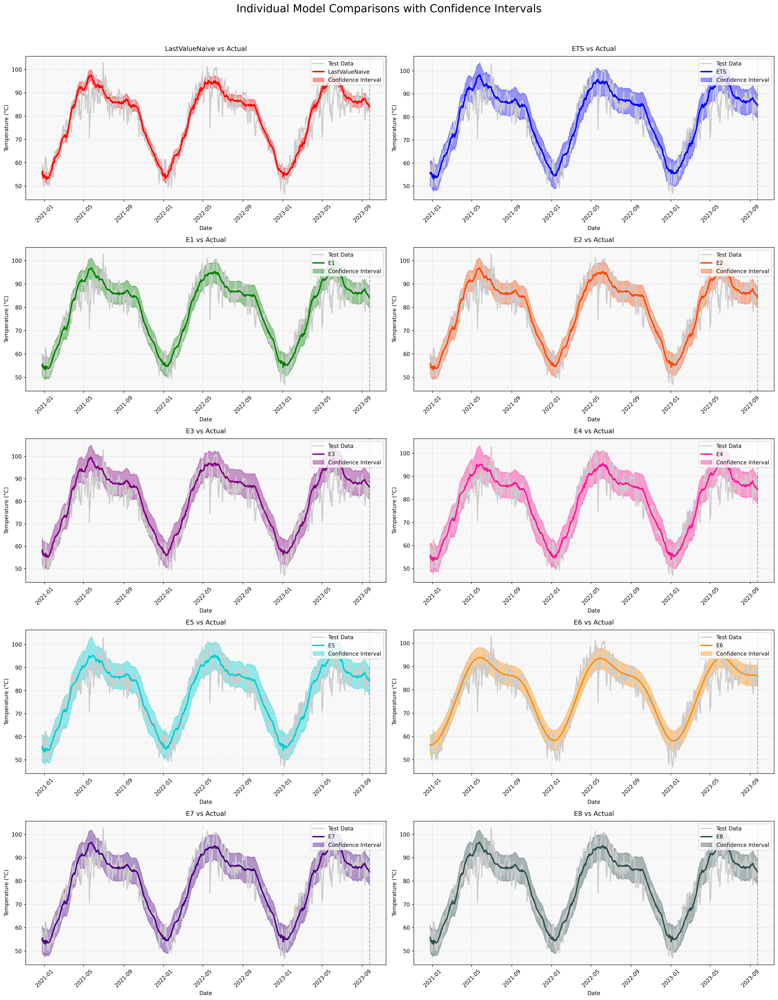

In [ ]:
# Calculate number of rows and columns for subplots
n_models = len(forecasts)
n_cols = 2
n_rows = (n_models + 1) // 2

# Create figure with subplots
fig, axes = plt.subplots(n_rows, n_cols, figsize=(20, 5*n_rows), dpi=300)
axes = axes.flatten()

# Dictionary to store model forecasts and bounds
model_forecasts = {
    "LastValueNaive": (LastValueNaive, LastValueNaive_forcast_unscaled),
    "ETS": (ets, ets_forcast_unscaled),
    "E1": (Ensemble_1, Ensemble_1_forcast_unscaled),
    "E2": (Ensemble_2, Ensemble_2_forcast_unscaled),
    "E3": (Ensemble_3, Ensemble_3_forcast_unscaled),
    "E4": (Ensemble_4, Ensemble_4_forcast_unscaled),
    "E5": (Ensemble_5, Ensemble_5_forcast_unscaled),
    "E6": (Ensemble_6, Ensemble_6_forcast_unscaled),
    "E7": (Ensemble_7, Ensemble_7_forcast_unscaled),
    "E8": (Ensemble_8, Ensemble_8_forcast_unscaled)
}

# Plot each model in a separate subplot
for idx, ((forecast, name), color) in enumerate(zip(forecasts, forecast_colors)):
    ax = axes[idx]
    
    # Get original model with bounds
    original_model = model_forecasts[name][0]
    
    # Unscale upper and lower bounds
    upper_unscaled = pd.DataFrame(
        scaler_train.inverse_transform(original_model.upper_forecast),
        columns=original_model.upper_forecast.columns,
        index=original_model.upper_forecast.index
    )
    lower_unscaled = pd.DataFrame(
        scaler_train.inverse_transform(original_model.lower_forecast),
        columns=original_model.lower_forecast.columns,
        index=original_model.lower_forecast.index
    )
    
    # Plot test data with lighter color
    ax.plot(
        test.index,
        test["Avg Temperature"],
        label="Test Data",
        color="#CCCCCC",
        linewidth=2,
    )
    
    # Plot forecast with vibrant color
    ax.plot(
        forecast.index,
        forecast["Avg Temperature"],
        label=f"{name}",
        color=color,
        linewidth=2.5,
    )
    
    # Add confidence intervals
    ax.fill_between(
        forecast.index,
        lower_unscaled["Avg Temperature"],
        upper_unscaled["Avg Temperature"],
        color=color,
        alpha=0.4,
        label="Confidence Interval"
    )
    
    # Add vertical line for forecast start
    ax.axvline(
        x=test.index[-1],
        color="#666666",
        linestyle="--",
        alpha=0.5
    )
    
    # Customize subplot
    ax.set_facecolor('#F8F8F8')
    ax.set_title(f"{name} vs Actual", fontsize=12, pad=10)
    ax.set_xlabel("Date", fontsize=10)
    ax.set_ylabel("Temperature (°C)", fontsize=10)
    ax.grid(True, linestyle="--", alpha=0.3, color='#999999')
    ax.tick_params(axis='x', rotation=45)
    ax.legend(loc='upper right', frameon=True, facecolor='white', edgecolor='#CCCCCC')

# Remove empty subplots if any
for idx in range(n_models, len(axes)):
    fig.delaxes(axes[idx])

# Add overall title
fig.suptitle(
    "Individual Model Comparisons with Confidence Intervals",
    fontsize=20,
    y=1.02
)

# Adjust layout
fig.patch.set_facecolor('white')
plt.tight_layout()

# Save the plot
plt.savefig(
    "individual_model_comparisons_with_bounds.png",
    dpi=300,
    bbox_inches="tight",
    facecolor="white",
    edgecolor="none"
)

plt.show()

### Models evaluation calcuation

In [71]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
import numpy as np


def calculate_metrics(actual, predicted):
    """Calculate multiple evaluation metrics"""
    mse = mean_squared_error(actual, predicted)
    rmse = np.sqrt(mse)
    mae = mean_absolute_error(actual, predicted)
    r2 = r2_score(actual, predicted)

    # Calculate MAPE
    mape = np.mean(np.abs((actual - predicted) / actual)) * 100

    return {"MSE": mse, "RMSE": rmse, "MAE": mae, "MAPE": mape, "R²": r2}


# Print metrics for all models
print("\nModel Performance Metrics:")
print("=" * 80)
print(
    f"{'Model Name':<15} {'MSE':>10} {'RMSE':>10} {'MAE':>10} {'MAPE':>10} {'R²':>10}"
)
print("-" * 80)

for forecast, name in forecasts:
    metrics = calculate_metrics(
        test["Avg Temperature"].values, forecast["Avg Temperature"].values
    )

    print(
        f"{name:<15} "
        f"{metrics['MSE']:>10.2f} "
        f"{metrics['RMSE']:>10.2f} "
        f"{metrics['MAE']:>10.2f} "
        f"{metrics['MAPE']:>10.2f}% "
        f"{metrics['R²']:>10.3f}"
    )

print("=" * 80)
print("\nMetric Descriptions:")
print("MSE  - Mean Squared Error (lower is better)")
print("RMSE - Root Mean Square Error (lower is better)")
print("MAE  - Mean Absolute Error (lower is better)")
print("MAPE - Mean Absolute Percentage Error (lower is better)")
print("R²   - R-squared score (higher is better, 1 is perfect)")

# Find and print best model for each metric
print("\nBest Models by Metric:")
print("-" * 40)

metrics_dict = {}
for forecast, name in forecasts:
    metrics_dict[name] = calculate_metrics(
        test["Avg Temperature"].values, forecast["Avg Temperature"].values
    )

for metric in ["MSE", "RMSE", "MAE", "MAPE", "R²"]:
    if metric != "R²":
        best_model = min(metrics_dict.items(), key=lambda x: x[1][metric])
    else:
        best_model = max(metrics_dict.items(), key=lambda x: x[1][metric])

    print(f"Best {metric:<4}: {best_model[0]:<15} ({best_model[1][metric]:.3f})")


Model Performance Metrics:
Model Name             MSE       RMSE        MAE       MAPE         R²
--------------------------------------------------------------------------------
LastValueNaive       25.44       5.04       3.80       5.00%      0.848
ETS                  27.48       5.24       3.97       5.24%      0.835
E1                   24.97       5.00       3.78       4.96%      0.851
E2                   24.97       5.00       3.78       4.96%      0.851
E3                   34.66       5.89       4.48       6.00%      0.793
E4                   23.65       4.86       3.71       4.89%      0.858
E5                   23.65       4.86       3.72       4.89%      0.858
E6                   22.86       4.78       3.75       5.03%      0.863
E7                   24.44       4.94       3.75       4.90%      0.854
E8                   24.44       4.94       3.75       4.90%      0.854

Metric Descriptions:
MSE  - Mean Squared Error (lower is better)
RMSE - Root Mean Square Error (low